# Customer Churn Analytics 

The objective of this project is to identify the plausible cause for Churn among customers using various analytical approaches.

The data used here is IBM's Telco Customer Churn Data. It boasts around 7043 customer details and their churn label.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import import_ipynb
import stats_nb

importing Jupyter notebook from stats_nb.ipynb
3875 1473 1695 7043
3555 3488 7043
1142 5901 7043
3402 3641 7043
1627 5416 7043
4974 1062 72 0 32.37114865824223
6361 682 7043
2971 3390 6361
2421 3096 1526 7043
2019 3498 5517
2429 3088 5517
2422 3095 5517
2044 3473 5517
2707 2810 5517
2732 2785 5517
4171 2872 7043
1544 1612 1522 2365 7043
64.76169246059918 2281.2532585545932
1869 5174 7043
6500 2003 4400.295754650007
100 5 58.69941786170666


In [2]:
df = pd.read_csv('cust_data.csv')
df.shape

(7043, 30)

In [3]:
df.head()

,CustomerID,City,Zip Code,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,...,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason,Contract Period
0,3668-QPYBK,Los Angeles,90003,33.964131,-118.272783,Male,No,No,No,2,...,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer,1
1,9237-HQITU,Los Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,2,...,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved,1
2,9305-CDSKC,Los Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,8,...,Yes,Electronic check,99.65,820.50,Yes,1,86,5372,Moved,1
3,7892-POOKP,Los Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,28,...,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved,1
4,0280-XJGEX,Los Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,49,...,Yes,Bank transfer (automatic),103.70,5036.30,Yes,1,89,5340,Competitor had better devices,1


In [4]:
# pip install import-ipynb    

In [5]:
total_monthly_contract = stats_nb.total_monthly_contract

### Check for various Labels

In [6]:
print('Phone Service', df['Phone Service'].unique())
print('Multiple Lines', df['Multiple Lines'].unique())
print('Internet Service', df['Internet Service'].unique())
print('Online Security', df['Online Security'].unique())
print('Online Backup', df['Online Backup'].unique())
print('Device Protection', df['Device Protection'].unique())
print('Tech Support', df['Tech Support'].unique())
print('Streaming TV', df['Streaming TV'].unique())
print('Streaming Movies', df['Streaming Movies'].unique())

Phone Service ['Yes' 'No']
Multiple Lines ['No' 'Yes' 'No phone service']
Internet Service ['DSL' 'Fiber optic' 'No']
Online Security ['Yes' 'No' 'No internet service']
Online Backup ['Yes' 'No' 'No internet service']
Device Protection ['No' 'Yes' 'No internet service']
Tech Support ['No' 'Yes' 'No internet service']
Streaming TV ['No' 'Yes' 'No internet service']
Streaming Movies ['No' 'Yes' 'No internet service']


In [7]:
contract_map = {
    'Monthly': total_monthly_contract,
    'Annually': stats_nb.total_annual_contract,
    'Binnually': stats_nb.total_binnual_contract
}

### Churn Reasoning

Collect all possible 'Churn Reason' so as to identify core probelms and perform analysis covering these aspect.

In [8]:
print("Unique churn reasons:")
churn_reasons = df['Churn Reason'].unique()
churn_reasons

Unique churn reasons:


array(['Competitor made better offer', 'Moved',
       'Competitor had better devices',
       'Competitor offered higher download speeds',
       'Competitor offered more data', 'Price too high',
       'Product dissatisfaction', 'Service dissatisfaction',
       'Lack of self-service on Website', 'Network reliability',
       'Limited range of services',
       'Lack of affordable download/upload speed',
       'Long distance charges', 'Extra data charges', "Don't know",
       'Poor expertise of online support',
       'Poor expertise of phone support', 'Attitude of service provider',
       'Attitude of support person', 'Deceased', nan], dtype=object)

We will now look into detail for these Churn Reasons in terms of Contract Period of Customers

In [9]:
freq_contract = []

for reason in churn_reasons:
    t = []
    month = df[(df['Churn Reason'] == reason) & (df['Contract Period'] == 1)].shape[0]
    ann = df[(df['Churn Reason'] == reason) & (df['Contract Period'] == 12)].shape[0]
    bi = df[(df['Churn Reason'] == reason) & (df['Contract Period'] == 24)].shape[0]
    t.extend([month, ann, bi])
    freq_contract.append(t)

print(freq_contract)

[[126, 10, 4], [43, 10, 0], [116, 10, 4], [161, 23, 5], [140, 16, 6], [89, 6, 3], [85, 10, 7], [83, 5, 1], [84, 2, 2], [92, 10, 1], [40, 4, 0], [36, 5, 3], [37, 5, 2], [53, 1, 3], [141, 12, 1], [18, 1, 0], [16, 3, 1], [115, 17, 3], [174, 16, 2], [6, 0, 0], [0, 0, 0]]


In [10]:
contract_period = ['Monthly', 'Annually', 'Biannually']

contract_period_reason_map = {churn_reasons[i]: freq_contract[i] for i in range(len(churn_reasons))}

print(contract_period_reason_map)

{'Competitor made better offer': [126, 10, 4], 'Moved': [43, 10, 0], 'Competitor had better devices': [116, 10, 4], 'Competitor offered higher download speeds': [161, 23, 5], 'Competitor offered more data': [140, 16, 6], 'Price too high': [89, 6, 3], 'Product dissatisfaction': [85, 10, 7], 'Service dissatisfaction': [83, 5, 1], 'Lack of self-service on Website': [84, 2, 2], 'Network reliability': [92, 10, 1], 'Limited range of services': [40, 4, 0], 'Lack of affordable download/upload speed': [36, 5, 3], 'Long distance charges': [37, 5, 2], 'Extra data charges': [53, 1, 3], "Don't know": [141, 12, 1], 'Poor expertise of online support': [18, 1, 0], 'Poor expertise of phone support': [16, 3, 1], 'Attitude of service provider': [115, 17, 3], 'Attitude of support person': [174, 16, 2], 'Deceased': [6, 0, 0], nan: [0, 0, 0]}


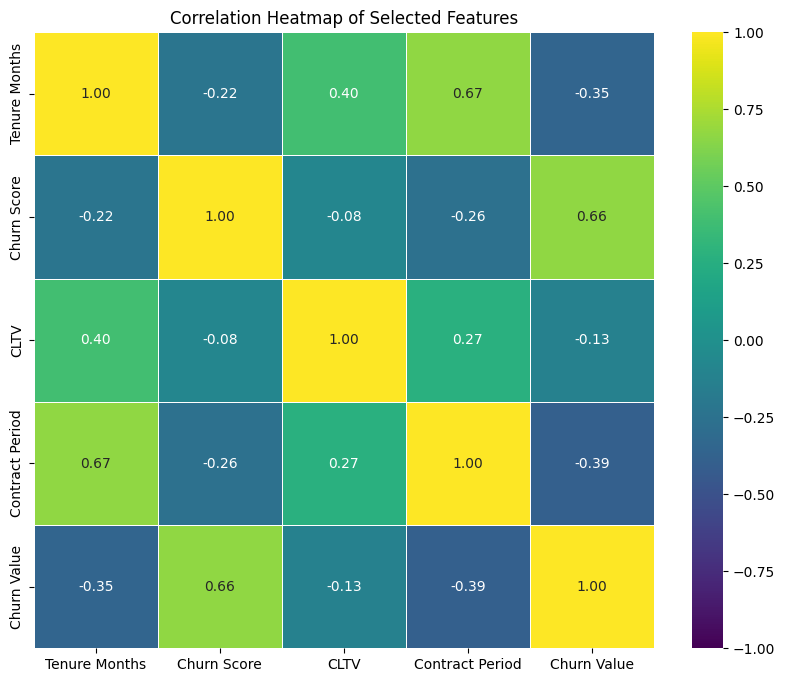

In [11]:
matrix = df[['Tenure Months', 'Churn Score', 'CLTV', 'Contract Period', 'Churn Value']]
correlation_matrix = matrix.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='viridis', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Heatmap of Selected Features')
plt.show()

As above Correlation Matrix represents, Churn Value and Contract Period along with Tenure Months has negative correlation. This is a small indication of less Churn Value/Score for larger Contract Periods. 

First assumption we can have is customers with longer Contract Period will eventually be retained for the next Quarter. Similar in terms of Tenure Months. 

Hence, mitigations should be provided for customers who are early in their tenure period.

Statistics for Churn Reason



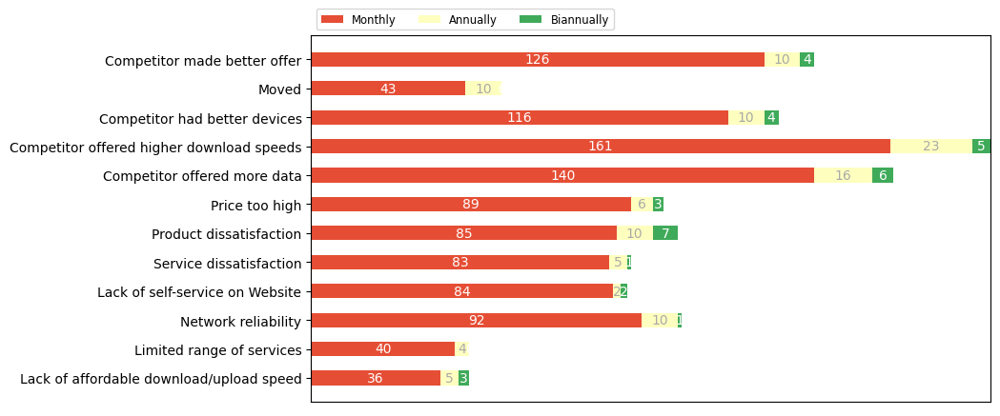

In [12]:
contract_period_reason_map = {
    'Competitor made better offer': [126, 10, 4],
    'Moved': [43, 10, 0],
    'Competitor had better devices': [116, 10, 4],
    'Competitor offered higher download speeds': [161, 23, 5],
    'Competitor offered more data': [140, 16, 6],
    'Price too high': [89, 6, 3],
    'Product dissatisfaction': [85, 10, 7],
    'Service dissatisfaction': [83, 5, 1],
    'Lack of self-service on Website': [84, 2, 2],
    'Network reliability': [92, 10, 1],
    'Limited range of services': [40, 4, 0],
    'Lack of affordable download/upload speed': [36, 5, 3],
}

def survey(results, category_names):
    labels = list(results.keys())
    data = np.array(list(results.values()))
    data_cum = data.cumsum(axis=1)
    category_colors = plt.get_cmap('RdYlGn')(np.linspace(0.15, 0.85, data.shape[1]))

    fig, ax = plt.subplots(figsize=(9.2, 5))
    ax.invert_yaxis()
    ax.xaxis.set_visible(False)
    ax.set_xlim(0, np.sum(data, axis=1).max())

    for i, (colname, color) in enumerate(zip(category_names, category_colors)):
        widths = data[:, i]
        starts = data_cum[:, i] - widths
        rects = ax.barh(labels, widths, left=starts, height=0.5,
                        label=colname, color=color)

        r, g, b, _ = color
        text_color = 'white' if r * g * b < 0.5 else 'darkgrey'
        
        widths_str = [str(width) for width in widths]
        ax.bar_label(rects, labels=widths_str, label_type='center', color=text_color)
    
    ax.legend(ncols=len(category_names), bbox_to_anchor=(0, 1),
              loc='lower left', fontsize='small')

    return fig, ax

print('Statistics for Churn Reason\n')
sns.set_palette('viridis')  
survey(contract_period_reason_map, contract_period)
plt.show()

#### Churn Value vs Contract Period

Now let us take us deep-dive into Contract Period and how it affects Customer Churn.

KeyError: 'Annually'

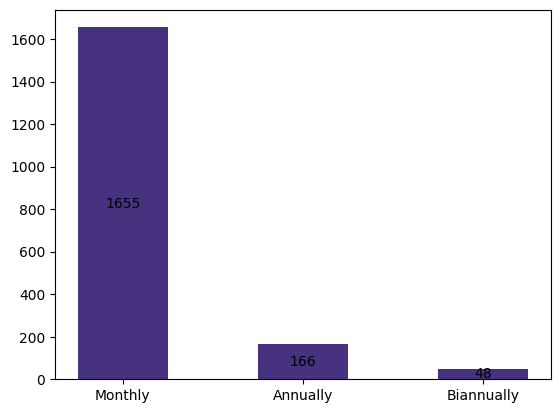

In [13]:
contract_counts = {
    'Yes': [stats_nb.total_churn_yes_monthly, stats_nb.total_churn_yes_annual, stats_nb.total_churn_yes_binnual],
    'No': [stats_nb.total_churn_no_monthly, stats_nb.total_churn_no_annual, stats_nb.total_churn_no_binnual]
}

width = 0.5

fig, ax = plt.subplots()
sns.set_palette('viridis')
bottom = np.zeros(3)

total_counts = np.zeros(3)

for contract_count in contract_counts.values():
    total_counts += np.array(contract_count)

percentages = {'Monthly': {}, 'Annual': {}, 'Biannual': {}}

for contract, contract_count in contract_counts.items():
    p = ax.bar(contract_period, contract_count, width, label=contract, bottom=bottom)
    bottom += contract_count
    ax.bar_label(p, label_type='center')

    for i, period in enumerate(contract_period):
        percentage = (contract_count[i] / total_counts[i]) * 100
        percentages[period][contract] = percentage

for period in contract_period:
    print(f"{period}: Yes = {percentages[period]['Yes']:.2f}%, No = {percentages[period]['No']:.2f}%")

ax.set_title('Churn Value vs Contract Period')
ax.legend()
plt.show()

The above clearly depicts distinction between how Contract Period affects Churn Prediction. 

Customers with Annual and Biannual Contract Period are very much likely to stay with the service for the next Quater in the least.

There is however almost equal partition for Monthly Contract. Here, we must implement new policies, offers and necessary mitigations.

#### Churn Variation considering Tenure Months of customers against Contract Periods

C:\Users\sudar\AppData\Local\Temp\ipykernel_20272\4291812010.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  churn_data = df.groupby(['Contract Period', 'Tenure Category'])['Churn Label'].value_counts(normalize=True).unstack().fillna(0)


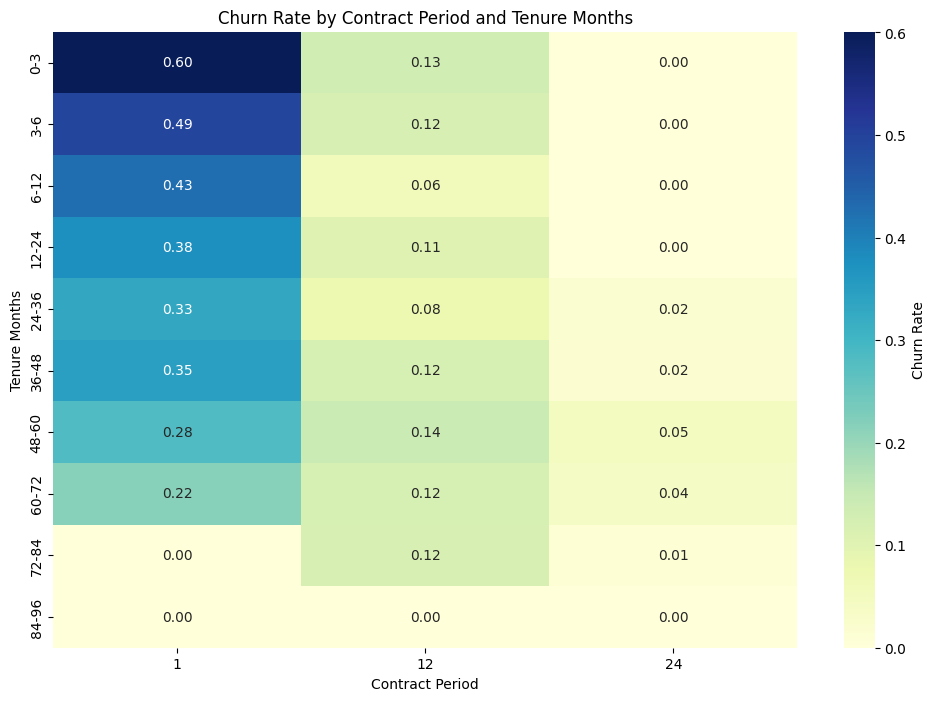

In [ ]:
bins = [0, 3, 6, 12, 24, 36, 48, 60, 72, 84, 96]
labels = ['0-3', '3-6', '6-12', '12-24', '24-36', '36-48', '48-60', '60-72', '72-84', '84-96']
df['Tenure Category'] = pd.cut(df['Tenure Months'], bins=bins, labels=labels, right=False)

churn_data = df.groupby(['Contract Period', 'Tenure Category'])['Churn Label'].value_counts(normalize=True).unstack().fillna(0)
churn_data = churn_data['Yes'] 
churn_pivot = churn_data.unstack(level=0)

plt.figure(figsize=(12, 8))
sns.set_palette('viridis')
sns.heatmap(churn_pivot, annot=True, fmt=".2f", cmap='YlGnBu', cbar_kws={'label': 'Churn Rate'})
plt.title('Churn Rate by Contract Period and Tenure Months')
plt.xlabel('Contract Period')
plt.ylabel('Tenure Months')
plt.show()

This churn rate variation shows that fresh customers with tenure months < 12 and monthly subscription are churning.

#### Customer Retention over Tenures

In [ ]:
current_quarter = df[(df['Tenure Months'] >= 0) & (df['Tenure Months'] <= 12)]
previous_quarter = df[(df['Tenure Months'] >= 12) & (df['Tenure Months'] <= 24)]

current_quarter_churn = current_quarter['Churn Label'].value_counts(normalize=True)
previous_quarter_churn = previous_quarter['Churn Label'].value_counts(normalize=True)

print("\nCurrent Quarter Churn Rate:")
print(current_quarter_churn)

print("\n\nPrevious Quarter Churn Rate:")
print(previous_quarter_churn)


Current Quarter Churn Rate:
Churn Label
No     0.525618
Yes    0.474382
Name: proportion, dtype: float64


Previous Quarter Churn Rate:
Churn Label
No     0.709027
Yes    0.290973
Name: proportion, dtype: float64


The churn rate has increased in the current quarter compared to the previous quarter. This represent loss of customer and possible continue for next quater if proper actions are not taken.

Numerical Statistics for Churn Ratio by Tenure Months


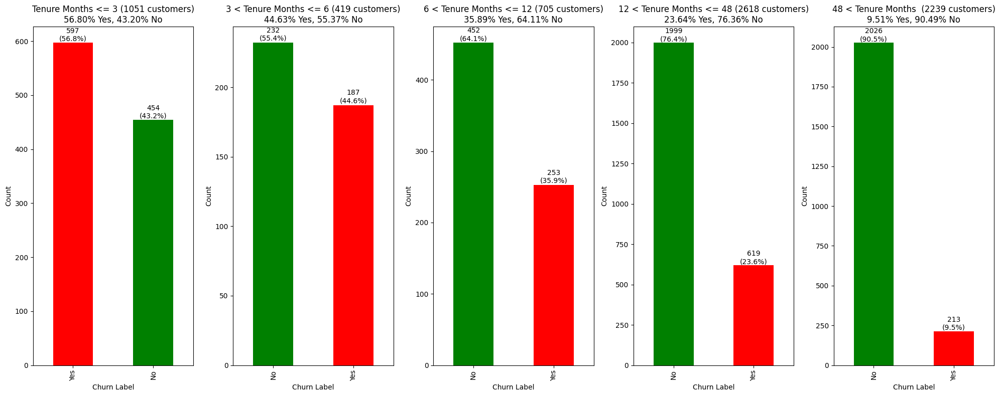

In [ ]:
tenure_ranges = [
    {'title': 'Tenure Months <= 3', 'range': (0, 3)},
    {'title': '3 < Tenure Months <= 6', 'range': (3, 6)},
    {'title': '6 < Tenure Months <= 12', 'range': (6, 12)},
    {'title': '12 < Tenure Months <= 48', 'range': (12, 48)},
    {'title': '48 < Tenure Months ', 'range': (48, 96)}
]


fig, axes = plt.subplots(1, 5, figsize=(20, 8))
colors = {'Yes': 'red', 'No': 'green'}

for i, tenure_range in enumerate(tenure_ranges):
    filtered_data = df[(df['Tenure Months'] > tenure_range['range'][0]) & (df['Tenure Months'] <= tenure_range['range'][1])]
    total_customers = filtered_data.shape[0]
    churn_counts = filtered_data['Churn Label'].value_counts()
    percent_yes = churn_counts.get('Yes', 0) / total_customers * 100
    percent_no = churn_counts.get('No', 0) / total_customers * 100
    

    ax = axes[i]
    churn_counts.plot(kind='bar', ax=ax, color=[colors.get(label, 'blue') for label in churn_counts.index])
    ax.set_xlabel('Churn Label')
    ax.set_ylabel('Count')
    ax.set_title(f'{tenure_range["title"]} ({total_customers} customers)\n{percent_yes:.2f}% Yes, {percent_no:.2f}% No')
    for j, count in enumerate(churn_counts):
        ax.text(j, count + 0.5, f'{count}\n({count / total_customers * 100:.1f}%)', ha='center', va='bottom', fontsize=10)


print("Numerical Statistics for Churn Ratio by Tenure Months")    

plt.tight_layout()
plt.show()

Above results depicts that most of the customers are retained once a 6-month tenure is over.

Customers within their first 4-5 months are most likely to Churn.

### Churn and Services

In [ ]:
services = ['Phone Service', 'Multiple Lines', 'Internet Service', 'Online Security', 'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV', 'Streaming Movies']

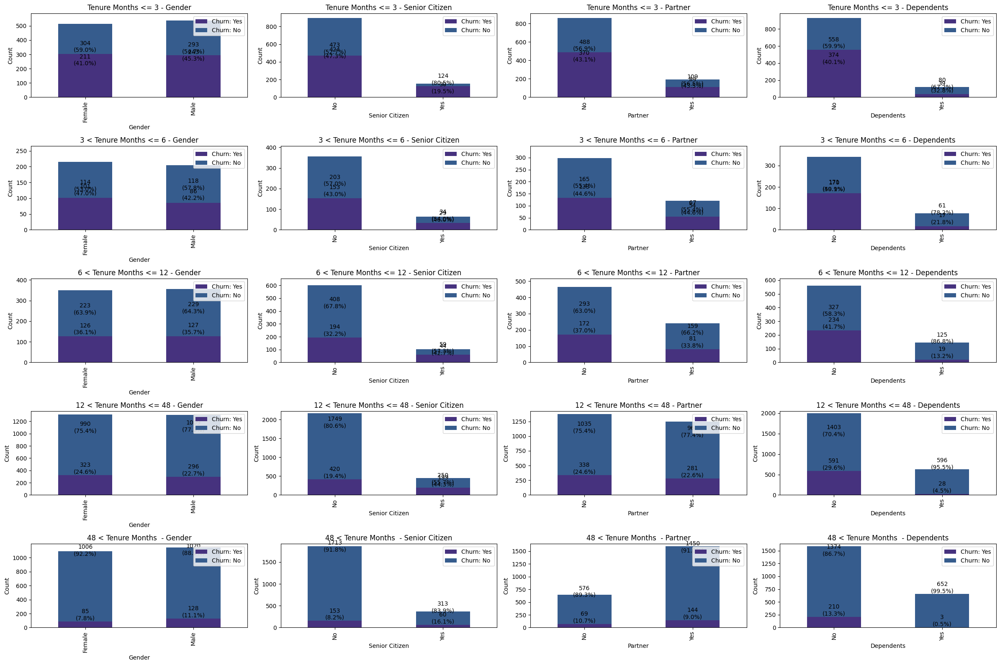

In [ ]:
# categories = ['Gender', 'Senior Citizen', 'Partner', 'Dependents']

# fig, axes = plt.subplots(len(tenure_ranges), len(categories), figsize=(24, 16))
# sns.set_palette('viridis')

# for i, tenure_range in enumerate(tenure_ranges):
#     filtered_data = df[(df['Tenure Months'] > tenure_range['range'][0]) & (df['Tenure Months'] <= tenure_range['range'][1])]
#     total_customers = filtered_data.shape[0]
    
#     for j, category in enumerate(categories):
#         churn_counts = filtered_data.groupby([category, 'Churn Label']).size().unstack(fill_value=0)
        
#         churn_counts['Total'] = churn_counts['No'] + churn_counts['Yes']
#         churn_counts['Percent_Yes'] = churn_counts['Yes'] / churn_counts['Total'] * 100
#         churn_counts['Percent_No'] = churn_counts['No'] / churn_counts['Total'] * 100
        
#         ax = axes[i, j]
#         churn_counts[['Yes', 'No']].plot(kind='bar', stacked=True, ax=ax)
#         ax.set_xlabel(category)
#         ax.set_ylabel('Count')
#         ax.set_title(f'{tenure_range["title"]} - {category}')
        
#         x_offsets = np.array([0.0, 0.0])
#         for idx, col in enumerate(['Yes', 'No']):
#             for idx2, val in enumerate(churn_counts[col]):
#                 ax.text(idx2, val + 5, f'{val}\n({churn_counts[f"Percent_{col}"].iloc[idx2]:.1f}%)', ha='center', va='bottom', fontsize=10)
        
#         ax.legend(['Churn: Yes', 'Churn: No'], loc='upper right')
#         ax.set_ylim(0, max(filtered_data[category].value_counts()) + 50)
    
# plt.tight_layout()
# plt.show()

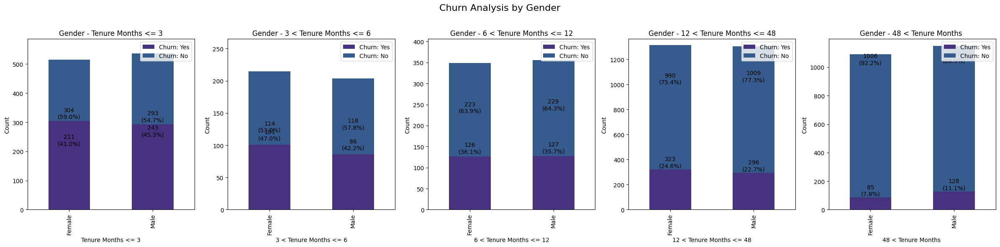

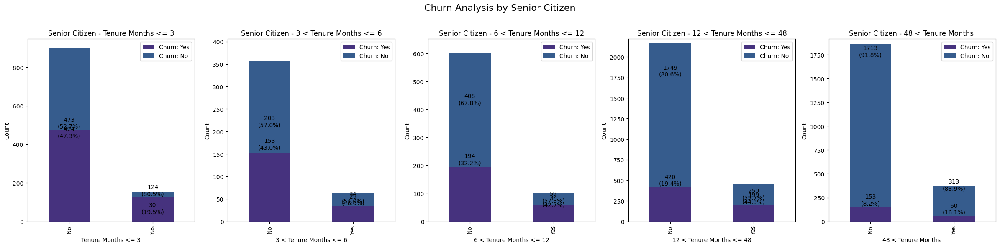

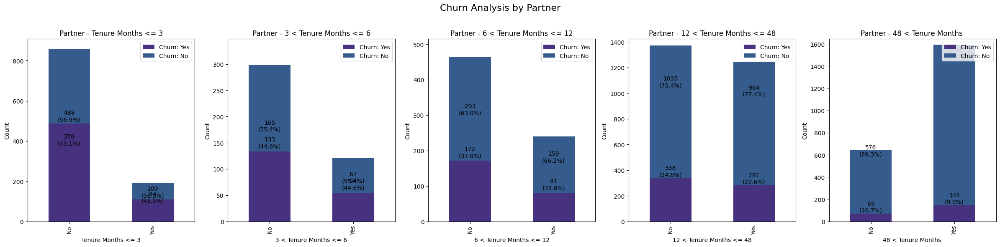

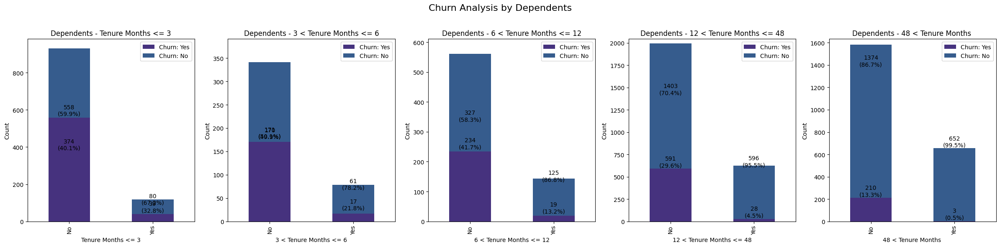

In [ ]:
categories = ['Gender', 'Senior Citizen', 'Partner', 'Dependents']

sns.set_palette('viridis')

for category in categories:
    fig, axes = plt.subplots(1, len(tenure_ranges), figsize=(24, 6))
    
    for i, tenure_range in enumerate(tenure_ranges):
        filtered_data = df[(df['Tenure Months'] > tenure_range['range'][0]) & (df['Tenure Months'] <= tenure_range['range'][1])]
        churn_counts = filtered_data.groupby([category, 'Churn Label']).size().unstack(fill_value=0)
        
        churn_counts['Total'] = churn_counts['No'] + churn_counts['Yes']
        churn_counts['Percent_Yes'] = churn_counts['Yes'] / churn_counts['Total'] * 100
        churn_counts['Percent_No'] = churn_counts['No'] / churn_counts['Total'] * 100
        
        ax = axes[i]
        churn_counts[['Yes', 'No']].plot(kind='bar', stacked=True, ax=ax)
        ax.set_xlabel(tenure_range['title'])
        ax.set_ylabel('Count')
        ax.set_title(f'{category} - {tenure_range["title"]}')
        
        x_offsets = np.array([0.0, 0.0])
        for idx, col in enumerate(['Yes', 'No']):
            for idx2, val in enumerate(churn_counts[col]):
                ax.text(idx2, val + 5, f'{val}\n({churn_counts[f"Percent_{col}"].iloc[idx2]:.1f}%)', ha='center', va='bottom', fontsize=10)
        
        ax.legend(['Churn: Yes', 'Churn: No'], loc='upper right')
        ax.set_ylim(0, max(filtered_data[category].value_counts()) + 50)
    
    plt.suptitle(f'Churn Analysis by {category}', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

Gender-wise Churn Rate is equalliy proportionate. There is significant retention of customers after a Tenure Period of 12 months.

It also depicts that most of the customers are aged less than 65 (Senior Citizen). 

Customers with partners tend to retain services for longer tenures. This gradually increases over time.

Customers with dependents are very likely to be retained. This is due to various services like Streaming TV, etc.

### Churn and Charges

In [ ]:
# plt.figure(figsize=(22, 17))

# sns.scatterplot(
#     x='Monthly Charges', 
#     y='Total Charges', 
#     hue='Churn Label', 
#     data=df,
#     palette={'Yes': 'red', 'No': 'blue'}
# )

# plt.title('Total Charges vs Monthly Charges vs Churn Value')
# plt.xlabel('Monthly Charges')
# plt.ylabel('Total Charges')
# plt.show()

C:\Users\sudar\AppData\Local\Temp\ipykernel_20272\4104027137.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_yes['Monthly Charges'], color='red', shade=True)
C:\Users\sudar\AppData\Local\Temp\ipykernel_20272\4104027137.py:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_no['Monthly Charges'], color='blue', shade=True)
C:\Users\sudar\AppData\Local\Temp\ipykernel_20272\4104027137.py:12: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_yes['Total Charges'], color='red', shade=True)
C:\Users\sudar\AppData\Local\Temp\ipykernel_20272\4104027137.py:13: FutureWarning: 

`shade` is now deprecated in favor of `fill`; set

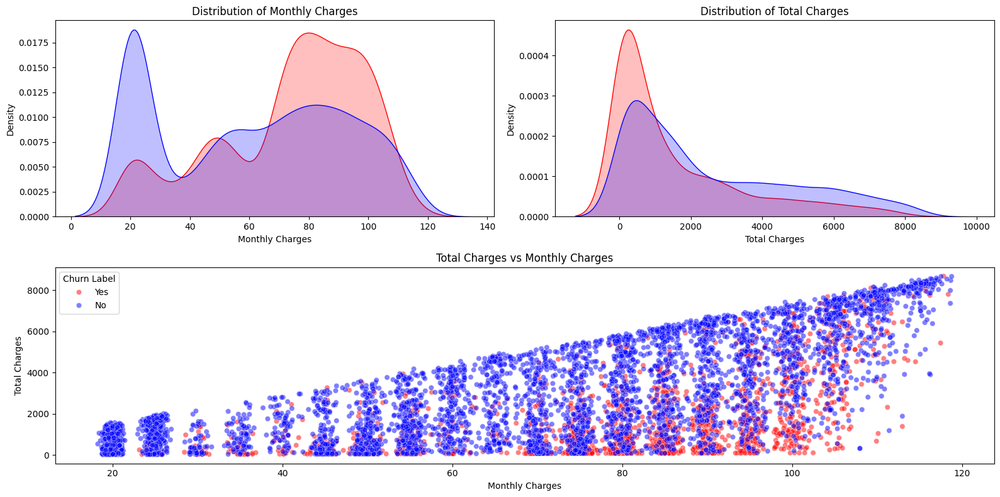

In [ ]:
df_yes = df[df['Churn Label'] == 'Yes']
df_no = df[df['Churn Label'] == 'No']

plt.figure(figsize=(16, 8))

plt.subplot(2, 2, 1)
sns.kdeplot(df_yes['Monthly Charges'], color='red', shade=True)
sns.kdeplot(df_no['Monthly Charges'], color='blue', shade=True)
plt.title('Distribution of Monthly Charges')

plt.subplot(2, 2, 2)
sns.kdeplot(df_yes['Total Charges'], color='red', shade=True)
sns.kdeplot(df_no['Total Charges'], color='blue', shade=True)
plt.title('Distribution of Total Charges')

plt.subplot(2, 1, 2)
sns.scatterplot(x='Monthly Charges', y='Total Charges', hue='Churn Label', data=df, palette={'Yes': 'red', 'No': 'blue'}, alpha=0.5)
plt.title('Total Charges vs Monthly Charges')
plt.xlabel('Monthly Charges')
plt.ylabel('Total Charges')

plt.tight_layout()
plt.show()

The above KDE distribution plot gives how customers spend for the services. 

In [ ]:
categories = ['Streaming TV', 'Streaming Movies']
tenure_ranges = [
    {'title': '0-12', 'range': (0, 12)},
    {'title': '13-24', 'range': (13, 24)},
    {'title': '25-36', 'range': (25, 36)},
    {'title': '37-48', 'range': (37, 48)},
    {'title': '49-60', 'range': (49, 60)},
    {'title': '61+', 'range': (61, df['Tenure Months'].max())}
]

data = []

for category in categories:
    for category_type in df[category].unique():
        for tenure_range in tenure_ranges:
            filtered_data = df[(df['Tenure Months'] > tenure_range['range'][0]) & 
                               (df['Tenure Months'] <= tenure_range['range'][1]) & 
                               (df[category] == category_type)]
            if filtered_data.empty:
                continue
            total_customers = filtered_data.shape[0]
            churn_counts = filtered_data['Churn Label'].value_counts(normalize=True) * 100
            percent_yes = churn_counts.get('Yes', 0)
            percent_no = churn_counts.get('No', 0)
            
            data.append({
                'Category': category,
                'Category Type': category_type,
                'Tenure Range': tenure_range['title'],
                'Percent Churn Yes': percent_yes,
                'Percent Churn No': percent_no
            })

categories_df = pd.DataFrame(data)

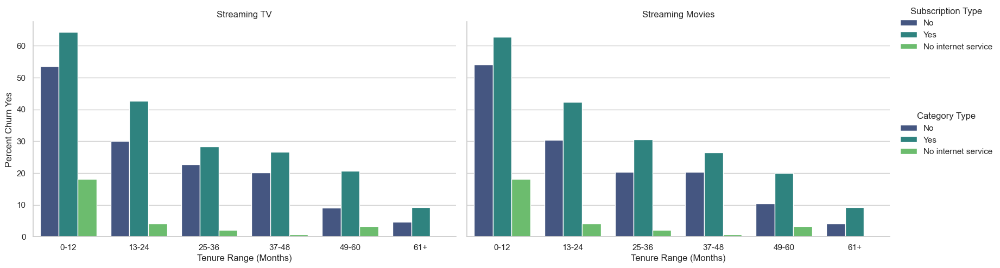

In [ ]:
sns.set(style="whitegrid")

g = sns.catplot(
    data=categories_df,
    x='Tenure Range',
    y='Percent Churn Yes',
    hue='Category Type',
    col='Category',
    kind='bar',
    height=5,
    aspect=1.5,
    palette='viridis'
)

g.set_axis_labels("Tenure Range (Months)", "Percent Churn Yes")
g.set_titles("{col_name}")

g.add_legend(title='Subscription Type', loc='upper right')

plt.show()

Customers with No internet service are less likely to Churn as tenure period increases. 

Customers with subscription to TV and Movies services are highly likely to churn within first 12 months of tenure. However, this churn rate is higher than that of with no subscription with internet services.

In [ ]:
billing_payment = ['Paperless Billing', 'Payment Method']

billing_payment_data = {
    'Billing/Payment': [],
    'Billing/Payment Type': [],
    'Churn': []
}

for billing in billing_payment:
    for billing_type in df[billing].unique():
        filtered_data = df[df[billing] == billing_type]
        
        churn_counts = filtered_data.groupby('Churn Label').size()
        total_customers = churn_counts.sum()
        churn_percent_yes = (churn_counts['Yes'] / total_customers) * 100
        
        billing_payment_data['Billing/Payment'].append(billing)
        billing_payment_data['Billing/Payment Type'].append(billing_type)
        billing_payment_data['Churn'].append(churn_percent_yes)


billing_payment_df = pd.DataFrame(billing_payment_data)

C:\Users\sudar\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\sudar\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


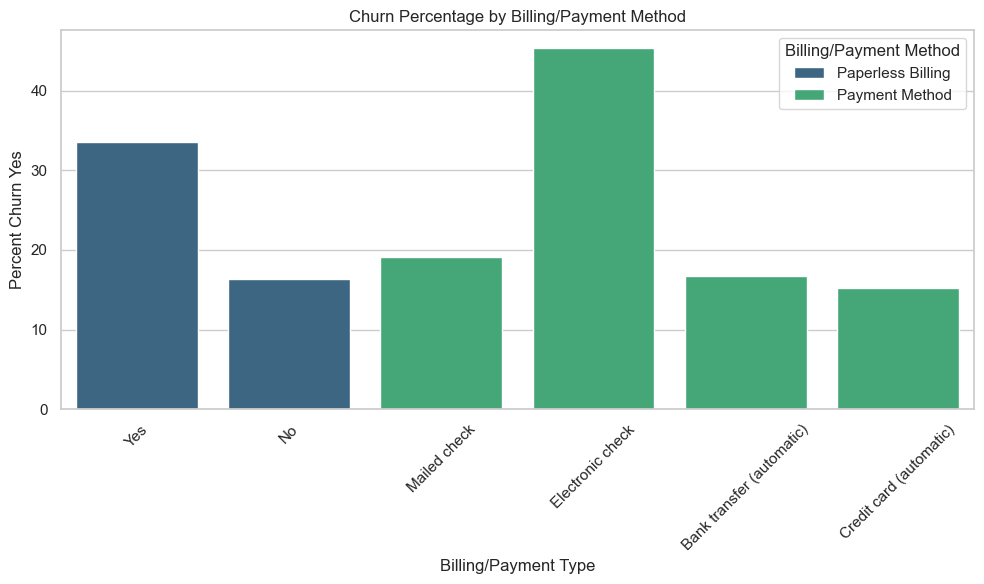

In [ ]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.barplot(
    data=billing_payment_df,
    x='Billing/Payment Type',
    y='Churn',
    hue='Billing/Payment',
    palette='viridis'
)
plt.xlabel('Billing/Payment Type')
plt.ylabel('Percent Churn Yes')
plt.title('Churn Percentage by Billing/Payment Method')
plt.xticks(rotation=45)
plt.legend(title='Billing/Payment Method', loc='upper right')
plt.tight_layout()
plt.show()

Customers with Electronic Check payment have churned more than any other type. This is also same in case with paperless billing. 

In [ ]:
churn_cltv = ['Churn Score', 'CLTV']

churn_cltv_data = {
    'Churn/CLTV': [],
    'Churn/CLTV Type': [],
    'Churn': []
}

avg_cltv = df['CLTV'].mean()
avf_churn_score = df['Churn Score'].mean()

for score_type in churn_cltv:
    below_avg_data = df[df[score_type] < df[score_type].mean()]
    above_avg_data = df[df[score_type] >= df[score_type].mean()]
    
    churn_counts_below = below_avg_data.groupby('Churn Label').size()
    total_customers_below = churn_counts_below.sum()
    churn_percent_yes_below = (churn_counts_below.get('Yes', 0) / total_customers_below) * 100
    
    churn_counts_above = above_avg_data.groupby('Churn Label').size()
    total_customers_above = churn_counts_above.sum()
    churn_percent_yes_above = (churn_counts_above.get('Yes', 0) / total_customers_above) * 100
    
    churn_cltv_data['Churn/CLTV'].append(score_type)
    churn_cltv_data['Churn/CLTV Type'].append('Below Average')
    churn_cltv_data['Churn'].append(churn_percent_yes_below)
    
    churn_cltv_data['Churn/CLTV'].append(score_type)
    churn_cltv_data['Churn/CLTV Type'].append('Above Average')
    churn_cltv_data['Churn'].append(churn_percent_yes_above)

churn_cltv_df = pd.DataFrame(churn_cltv_data)

C:\Users\sudar\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\sudar\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


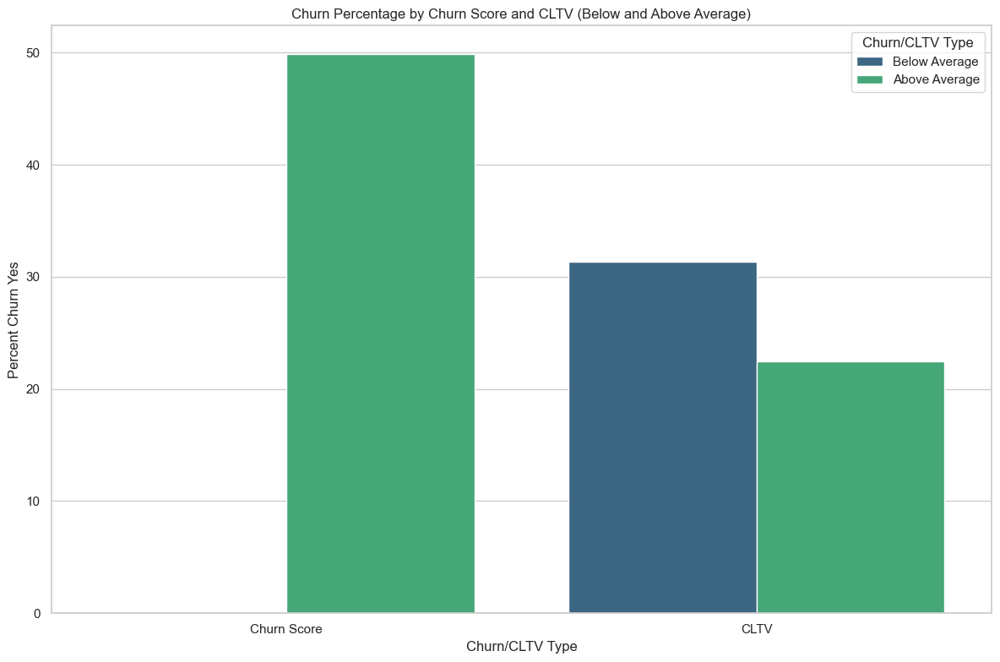

In [ ]:
sns.set(style="whitegrid")

plt.figure(figsize=(12, 8))
sns.barplot(
    data=churn_cltv_df,
    x='Churn/CLTV',
    y='Churn',
    hue='Churn/CLTV Type',
    palette='viridis'
)

plt.xlabel('Churn/CLTV Type')
plt.ylabel('Percent Churn Yes')
plt.title('Churn Percentage by Churn Score and CLTV (Below and Above Average)')
plt.legend(title='Churn/CLTV Type', loc='upper right')
plt.tight_layout()
plt.show()

In [ ]:
df['Churn Label'].value_counts()    

Churn Label
No     5174
Yes    1869
Name: count, dtype: int64

In [ ]:
# pip install folium

In [ ]:
import folium
from folium.plugins import MarkerCluster


m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=4)

marker_cluster = MarkerCluster().add_to(m)

for i, row in df.iterrows():
    popup_info = (
        f"Churn Value: {row['Churn Value']}<br>"
        f"Customer ID: {row['CustomerID']}<br>"
        f"CLTV: {row['CLTV']}<br>"
        f"Payment Method: {row['Payment Method']}<br>"
        f"Tenure Months: {row['Tenure Months']}"
    )
    
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,  
        popup=folium.Popup(popup_info, max_width=300),
        color='blue' if row['Churn Value'] == 0 else 'red',
        fill=True,
        fill_opacity=0.7
    ).add_to(marker_cluster)

m.save('customer_churn_map_with_marker_cluster.html')
m

Customers location marked on OSM.